## Import Libraries

In [1]:
import os
import git
import math
import shutil
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
import sys
sys.path.append('../')

from copy_files import copy_files
from generate_images import generate_images

## Data Augmentation (Keras)

In [3]:
img_dir = os.path.abspath('../../datasets/HAM10000/image-data-generator').replace(os.sep, '/')

if os.path.exists(img_dir):
    print("Folders already exist!")
else:
    os.makedirs(img_dir)

    targetnames = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'vasc']
    for i in targetnames:
        os.makedirs(img_dir + '/' + i)

    print("Folders successfully created!")

Folders successfully created!


In [4]:
images_needed = [1600, 1600, 2600, 600, 2600, 600]
targetnames = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'vasc']

for idx, i in enumerate(targetnames):
    source_path = os.path.abspath('../../datasets/HAM10000/split/train/').replace(os.sep, '/')
    source_path = os.path.join(source_path, i).replace(os.sep, '/')
    
    save_path = os.path.abspath('../../datasets/HAM10000/image-data-generator/').replace(os.sep, '/')
    save_path = os.path.join(save_path, i).replace(os.sep, '/')

    generate_images(
        source_path, 
        save_path, 
        images_needed[idx], 
        rotation_range=180, 
        width_shift_range=0.1, 
        height_shift_range=0.1
    )

Found 304 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 304/304 [00:00<00:00, 3097.38it/s]


Found 488 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 488/488 [00:00<00:00, 3336.85it/s]


Found 1033 images belonging to 1 classes.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1033/1033 [00:00<00:00, 3215.23it/s]

Found 109 images belonging to 1 classes.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 109/109 [00:00<00:00, 3380.08it/s]


Found 1079 images belonging to 1 classes.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1079/1079 [00:00<00:00, 3211.39it/s]

Found 132 images belonging to 1 classes.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 132/132 [00:00<00:00, 3353.70it/s]


## Data Visualization

In [5]:
original_dir = os.path.abspath('../../datasets/HAM10000/split/train')
oversample_dir = os.path.abspath('../../datasets/HAM10000/image-data-generator')

targetnames = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

for x in targetnames:    
    original = globals()['%s_original' % x] = len(os.listdir(original_dir + '/' + x))
    if x != 'nv':
        oversample = globals()['%s_oversample' % x] = len(os.listdir(oversample_dir + '/' + x))
        globals()['%s_generated' % x] = oversample - original
        
for x in targetnames:
    if x != 'nv':
        globals()['%s_GAN' % x] = nv_original - globals()['%s_oversample' % x]

In [6]:
df = pd.DataFrame([['akiec', akiec_original, akiec_generated, akiec_GAN],
                   ['bcc', bcc_original, bcc_generated, bcc_GAN],
                   ['bkl', bkl_original, bkl_generated, bkl_GAN],
                   ['df', df_original, df_generated, df_GAN],
                   ['mel', mel_original, mel_generated, mel_GAN],
                   ['nv', nv_original, 0, 0],
                   ['vasc', vasc_original, vasc_generated, vasc_GAN]],
                  columns=['Lesion', 'Original', 'Generated', 'GAN'])

In [7]:
df

,Lesion,Original,Generated,GAN
0,akiec,304,1520,4218
1,bcc,488,1528,4026
2,bkl,1033,2578,2431
3,df,109,532,5401
4,mel,1079,2606,2357
5,nv,6042,0,0
6,vasc,132,524,5386


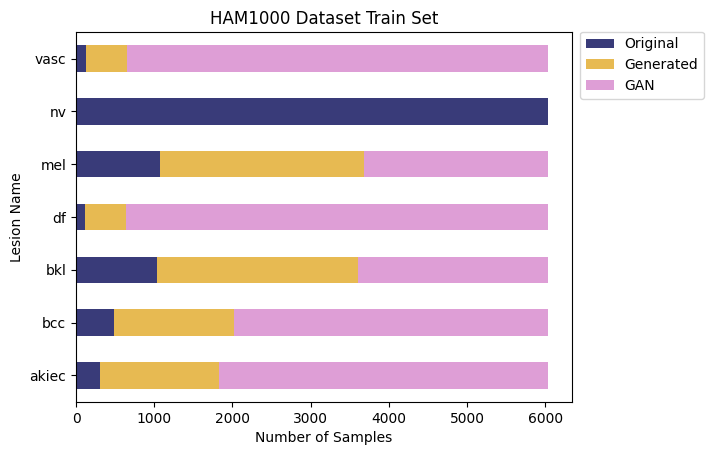

In [8]:
df.plot(x='Lesion',
        kind='barh',
        mark_right = True,
        stacked=True,
        cmap="tab20b",
        title='HAM1000 Dataset Train Set')

plt.ylabel('Lesion Name')
plt.xlabel('Number of Samples')
plt.legend(loc='upper right', bbox_to_anchor=(1.28, 1.02))
plt.show()

## Create Folders for Oversampling and Filtering

In [9]:
style_dir = os.path.abspath('../../datasets/HAM10000/stylegan2-ada')

if os.path.exists(style_dir):
    print("Folders already exist!")
else:
    os.makedirs(style_dir)
    
    networks = os.path.join(style_dir, 'networks/')
    os.makedirs(networks)
    
    oversampling = os.path.join(style_dir, 'oversampling/')
    os.makedirs(oversampling)
    
    targetnames = ['No-Filtering', 'FBGT', 'FAGT']
    classes = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'vasc']
    hyperparameters = ['alpha_1', 'alpha_2', 'alpha_3']
    category_1 = ['oversample', 'filtered', 'removed']
    category_2 = ['oversample']
    
    
    for i in targetnames:
        if i == 'No-Filtering':
            for j in classes:
                os.makedirs(networks + i + '/' + j)
                for k in category_2:
                    os.makedirs(oversampling + i + '/' + k + '/' + j)
        elif i == 'FBGT':
            for j in hyperparameters:
                for k in classes:
                    os.makedirs(networks + i + '/' + j + '/' + k)
                    for l in category_1:
                        os.makedirs(oversampling + i + '/' + j + '/' + l + '/' + k)
        elif i == 'FAGT':
            for j in hyperparameters:
                for k in classes:
                    for l in category_1:
                        os.makedirs(oversampling + i + '/' + j + '/' + l + '/' + k)
            
    print("Folders successfully created!")

Folders successfully created!


## Create Folders for GAN and Model Training

In [10]:
dataset_dir = os.path.abspath('../../datasets/HAM10000/dataset-processed')

if os.path.exists(dataset_dir):
    print("Folders already exist!")
else:
    os.makedirs(dataset_dir)
    
    targetnames = ['dataset-gan', 'dataset-models']
    for i in targetnames:
        os.makedirs(os.path.join(dataset_dir, i))
            
    print("Folders successfully created!")

Folders successfully created!


## <font color='red'>FBGT Script</font> 

#### <font color='red'>**Warning!</font> Must compute FBGT process first. 

#### **The notebook <font color='RoyalBlue'>HAM10000_FBGT</font> contains the code for this process.

##  Create Dataset for GAN Training (No-Filtering & FAGT) 

In [11]:
src_dir = os.path.abspath('../../datasets/HAM10000/image-data-generator')
des_dir = os.path.abspath('../../datasets/HAM10000/dataset-processed/dataset-gan')

In [12]:
shutil.make_archive(os.path.join(des_dir, 'HAM10000-gan-no-filtering'), 'zip', src_dir)

'D:\\Research\\Archive\\cossif\\datasets\\HAM10000\\dataset-processed\\dataset-gan\\HAM10000-gan-no-filtering.zip'

## Create Dataset for GAN Training (FBGT)

In [13]:
# root directory
root_dir = os.path.abspath('../../datasets/HAM10000/')

# creating temp folder
temp_dir = os.path.join(root_dir, 'dataset-processed/dataset-gan/temp')

if os.path.exists(temp_dir):
    shutil.rmtree(temp_dir)
os.makedirs(temp_dir)

classes = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'vasc']
hyperparameters = ['alpha_1', 'alpha_2', 'alpha_3']

# creating class folders
for i in hyperparameters:
    for j in classes:
        os.makedirs(os.path.join(temp_dir, i, j))

# approximation of images needed
images_needed = [1600, 1600, 2600, 600, 2600, 600]

for hp in hyperparameters:
    for idx, i in enumerate(classes):
        source_path = os.path.abspath('../../datasets/HAM10000/stylegan2-ada/oversampling/FBGT')
        source_path = os.path.join(source_path, hp, 'filtered', i)

        save_path = os.path.abspath('../../datasets/HAM10000/dataset-processed/dataset-gan/temp')
        save_path = os.path.join(save_path, hp, i)

        generate_images(
            source_path, 
            save_path, 
            images_needed[idx], 
            rotation_range=180, 
            width_shift_range=0.1, 
            height_shift_range=0.1
        )
        
# creating zip 
output_dir = os.path.join(root_dir, 'dataset-processed/dataset-gan')
shutil.make_archive(os.path.join(output_dir, 'ham10000-gan-fbgt'), 'zip', temp_dir)
shutil.rmtree(temp_dir)
print('Done!')

Found 244 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 244/244 [00:00<00:00, 3108.27it/s]


Found 391 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 391/391 [00:00<00:00, 3155.77it/s]


Found 827 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 827/827 [00:00<00:00, 3178.76it/s]

Found 88 images belonging to 1 classes.



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 88/88 [00:00<00:00, 3044.97it/s]


Found 864 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [00:00<00:00, 3104.63it/s]

Found 106 images belonging to 1 classes.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 106/106 [00:00<00:00, 3135.97it/s]

Found 259 images belonging to 1 classes.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 259/259 [00:00<00:00, 3396.85it/s]


Found 415 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 415/415 [00:00<00:00, 3333.01it/s]


Found 879 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 879/879 [00:00<00:00, 2913.46it/s]

Found 93 images belonging to 1 classes.



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 93/93 [00:00<00:00, 3100.03it/s]


Found 918 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 918/918 [00:00<00:00, 3105.33it/s]

Found 113 images belonging to 1 classes.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 113/113 [00:00<00:00, 2918.43it/s]

Found 274 images belonging to 1 classes.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 274/274 [00:00<00:00, 3226.23it/s]


Found 440 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 440/440 [00:00<00:00, 3299.86it/s]


Found 930 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 930/930 [00:00<00:00, 2999.22it/s]

Found 99 images belonging to 1 classes.



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 99/99 [00:00<00:00, 3071.20it/s]


Found 972 images belonging to 1 classes.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 972/972 [00:00<00:00, 3173.08it/s]

Found 119 images belonging to 1 classes.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 3256.53it/s]


Done!


##  <font color='red'>GAN Script</font>

#### <font color='red'>**Warning!</font> Must complete GAN training first. 

#### **The notebook <font color='RoyalBlue'>HAM10000_GAN_train</font> contains the code for this process.

## SyleGAN-2-ADA Repository

In [14]:
path = os.path.abspath('../../repository/StyleGAN2-ADA')

if os.path.exists(path):
    print("Folder already exist!")
else:
    os.makedirs(path)
    print("Folder successfully created!")
    git.Git(path).clone('https://github.com/dvschultz/stylegan2-ada-pytorch')
    print("Repository successfully cloned!")

Folder already exist!


In [15]:
repo = os.path.abspath('../../repository/StyleGAN2-ADA/stylegan2-ada-pytorch')
%cd $repo

D:\Research\Archive\cossif\repository\StyleGAN2-ADA\stylegan2-ada-pytorch


## Oversampling (No-Filtering)

In [16]:
dataset_dir = os.path.abspath('../../../datasets/HAM10000/stylegan2-ada')

network_path = os.path.join(dataset_dir, 'networks/No-Filtering/')
generate_path = os.path.join(dataset_dir, 'oversampling/No-Filtering/oversample')

akiec_network_path = os.path.join(network_path, 'akiec/akiec-network-snapshot-000400.pkl')
bcc_network_path = os.path.join(network_path, 'bcc/bcc-network-snapshot-000400.pkl')
bkl_network_path = os.path.join(network_path, 'bkl/bkl-network-snapshot-000400.pkl')
df_network_path = os.path.join(network_path, 'df/df-network-snapshot-000400.pkl')
mel_network_path = os.path.join(network_path, 'mel/mel-network-snapshot-000400.pkl')
vasc_network_path = os.path.join(network_path, 'vasc/vasc-network-snapshot-000400.pkl')

akiec_generate_path = os.path.join(generate_path, 'akiec')
bcc_generate_path = os.path.join(generate_path, 'bcc')
bkl_generate_path = os.path.join(generate_path, 'bkl')
df_generate_path = os.path.join(generate_path, 'df')
mel_generate_path = os.path.join(generate_path, 'mel')
vasc_generate_path = os.path.join(generate_path, 'vasc')

In [17]:
print("α = 1.0 | akiec: ", akiec_GAN)
print("α = 1.0 | bcc: ", bcc_GAN)
print("α = 1.0 | bkl: ", bkl_GAN)
print("α = 1.0 | df: ", df_GAN)
print("α = 1.0 | mel: ", mel_GAN)
print("α = 1.0 | vasc: ", vasc_GAN)

α = 1.0 | akiec:  4218
α = 1.0 | bcc:  4026
α = 1.0 | bkl:  2431
α = 1.0 | df:  5401
α = 1.0 | mel:  2357
α = 1.0 | vasc:  5386


In [18]:
!python generate.py --outdir=$akiec_generate_path --network=$akiec_network_path --trunc=0.7 --seeds=1-4218

!python generate.py --outdir=$bcc_generate_path --network=$bcc_network_path --trunc=0.7 --seeds=1-4026

!python generate.py --outdir=$bkl_generate_path --network=$bkl_network_path --trunc=0.7 --seeds=1-2431

!python generate.py --outdir=$df_generate_path --network=$df_network_path --trunc=0.7 --seeds=1-5401

!python generate.py --outdir=$mel_generate_path --network=$mel_network_path --trunc=0.7 --seeds=1-2357

!python generate.py --outdir=$vasc_generate_path --network=$vasc_network_path --trunc=0.7 --seeds=1-5386

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/akiec/akiec-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4218) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4218) ...
Generating image for seed 3 (2/4218) ...
Generating image for seed 4 (3/4218) ...
Generating image for seed 5 (4/4218) ...
Generating image for seed 6 (5/4218) ...
Generating image for seed 7 (6/4218) ...
Generating image for seed 8 (7/4218) ...
Generating image for seed 9 (8/4218) ...
Generating image for seed 10 (9/4218) ...
Generating image for seed 11 (10/4218) ...
Generating image for seed 12 (11/4218) ...
Generating image for seed 13 (12/4218) ...
Generating image for seed 14 (13/4218) ...
Generating image for seed 15 (14/4218) ...
Generating image for seed 16 (15/4218) ...
Generating image for seed 17 (16/4218) ...
Generating image for seed 18 (17/

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bcc/bcc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4026) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4026) ...
Generating image for seed 3 (2/4026) ...
Generating image for seed 4 (3/4026) ...
Generating image for seed 5 (4/4026) ...
Generating image for seed 6 (5/4026) ...
Generating image for seed 7 (6/4026) ...
Generating image for seed 8 (7/4026) ...
Generating image for seed 9 (8/4026) ...
Generating image for seed 10 (9/4026) ...
Generating image for seed 11 (10/4026) ...
Generating image for seed 12 (11/4026) ...
Generating image for seed 13 (12/4026) ...
Generating image for seed 14 (13/4026) ...
Generating image for seed 15 (14/4026) ...
Generating image for seed 16 (15/4026) ...
Generating image for seed 17 (16/4026) ...
Generating image for seed 18 (17/4026

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bkl/bkl-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2431) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2431) ...
Generating image for seed 3 (2/2431) ...
Generating image for seed 4 (3/2431) ...
Generating image for seed 5 (4/2431) ...
Generating image for seed 6 (5/2431) ...
Generating image for seed 7 (6/2431) ...
Generating image for seed 8 (7/2431) ...
Generating image for seed 9 (8/2431) ...
Generating image for seed 10 (9/2431) ...
Generating image for seed 11 (10/2431) ...
Generating image for seed 12 (11/2431) ...
Generating image for seed 13 (12/2431) ...
Generating image for seed 14 (13/2431) ...
Generating image for seed 15 (14/2431) ...
Generating image for seed 16 (15/2431) ...
Generating image for seed 17 (16/2431) ...
Generating image for seed 18 (17/2431

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/df/df-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5401) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5401) ...
Generating image for seed 3 (2/5401) ...
Generating image for seed 4 (3/5401) ...
Generating image for seed 5 (4/5401) ...
Generating image for seed 6 (5/5401) ...
Generating image for seed 7 (6/5401) ...
Generating image for seed 8 (7/5401) ...
Generating image for seed 9 (8/5401) ...
Generating image for seed 10 (9/5401) ...
Generating image for seed 11 (10/5401) ...
Generating image for seed 12 (11/5401) ...
Generating image for seed 13 (12/5401) ...
Generating image for seed 14 (13/5401) ...
Generating image for seed 15 (14/5401) ...
Generating image for seed 16 (15/5401) ...
Generating image for seed 17 (16/5401) ...
Generating image for seed 18 (17/5401) 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/mel/mel-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2357) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2357) ...
Generating image for seed 3 (2/2357) ...
Generating image for seed 4 (3/2357) ...
Generating image for seed 5 (4/2357) ...
Generating image for seed 6 (5/2357) ...
Generating image for seed 7 (6/2357) ...
Generating image for seed 8 (7/2357) ...
Generating image for seed 9 (8/2357) ...
Generating image for seed 10 (9/2357) ...
Generating image for seed 11 (10/2357) ...
Generating image for seed 12 (11/2357) ...
Generating image for seed 13 (12/2357) ...
Generating image for seed 14 (13/2357) ...
Generating image for seed 15 (14/2357) ...
Generating image for seed 16 (15/2357) ...
Generating image for seed 17 (16/2357) ...
Generating image for seed 18 (17/2357

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/vasc/vasc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5386) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5386) ...
Generating image for seed 3 (2/5386) ...
Generating image for seed 4 (3/5386) ...
Generating image for seed 5 (4/5386) ...
Generating image for seed 6 (5/5386) ...
Generating image for seed 7 (6/5386) ...
Generating image for seed 8 (7/5386) ...
Generating image for seed 9 (8/5386) ...
Generating image for seed 10 (9/5386) ...
Generating image for seed 11 (10/5386) ...
Generating image for seed 12 (11/5386) ...
Generating image for seed 13 (12/5386) ...
Generating image for seed 14 (13/5386) ...
Generating image for seed 15 (14/5386) ...
Generating image for seed 16 (15/5386) ...
Generating image for seed 17 (16/5386) ...
Generating image for seed 18 (17/53

## Oversampling (FAGT)

In [19]:
main_dir = os.path.abspath('../../../datasets/HAM10000/stylegan2-ada/')

In [20]:
akiec_network_path = os.path.join(main_dir, 'networks/No-Filtering/akiec/akiec-network-snapshot-000400.pkl')
bcc_network_path = os.path.join(main_dir, 'networks/No-Filtering/bcc/bcc-network-snapshot-000400.pkl')
bkl_network_path = os.path.join(main_dir, 'networks/No-Filtering/bkl/bkl-network-snapshot-000400.pkl')
df_network_path = os.path.join(main_dir, 'networks/No-Filtering/df/df-network-snapshot-000400.pkl')
mel_network_path = os.path.join(main_dir, 'networks/No-Filtering/mel/mel-network-snapshot-000400.pkl')
vasc_network_path = os.path.join(main_dir, 'networks/No-Filtering/vasc/vasc-network-snapshot-000400.pkl')

### FAGT | α = 0.75 | alpha_1

In [21]:
generate_path = os.path.join(main_dir, 'oversampling/FAGT/alpha_1/oversample')

akiec_generate_path = os.path.join(generate_path, 'akiec')
bcc_generate_path = os.path.join(generate_path, 'bcc')
bkl_generate_path = os.path.join(generate_path, 'bkl')
df_generate_path = os.path.join(generate_path, 'df')
mel_generate_path = os.path.join(generate_path, 'mel')
vasc_generate_path = os.path.join(generate_path, 'vasc')

In [22]:
num_of_akiec = math.floor((100*akiec_GAN)/75)
num_of_bcc = math.floor((100*bcc_GAN)/75)
num_of_bkl = math.floor((100*bkl_GAN)/75)
num_of_df = math.floor((100*df_GAN)/75)
num_of_mel = math.floor((100*mel_GAN)/75)
num_of_vasc = math.floor((100*vasc_GAN)/75)

print("α = 0.75 | akiec: ", num_of_akiec)
print("α = 0.75 | bcc: ", num_of_bcc)
print("α = 0.75 | bkl: ", num_of_bkl)
print("α = 0.75 | df: ", num_of_df)
print("α = 0.75 | mel: ", num_of_mel)
print("α = 0.75 | vasc: ", num_of_vasc)

α = 0.75 | akiec:  5624
α = 0.75 | bcc:  5368
α = 0.75 | bkl:  3241
α = 0.75 | df:  7201
α = 0.75 | mel:  3142
α = 0.75 | vasc:  7181


In [23]:
!python generate.py --outdir=$akiec_generate_path --network=$akiec_network_path --trunc=0.7 --seeds=1-5624

!python generate.py --outdir=$bcc_generate_path --network=$bcc_network_path --trunc=0.7 --seeds=1-5368

!python generate.py --outdir=$bkl_generate_path --network=$bkl_network_path --trunc=0.7 --seeds=1-3241

!python generate.py --outdir=$df_generate_path --network=$df_network_path --trunc=0.7 --seeds=1-7201

!python generate.py --outdir=$mel_generate_path --network=$mel_network_path --trunc=0.7 --seeds=1-3142

!python generate.py --outdir=$vasc_generate_path --network=$vasc_network_path --trunc=0.7 --seeds=1-7181

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/akiec/akiec-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5624) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5624) ...
Generating image for seed 3 (2/5624) ...
Generating image for seed 4 (3/5624) ...
Generating image for seed 5 (4/5624) ...
Generating image for seed 6 (5/5624) ...
Generating image for seed 7 (6/5624) ...
Generating image for seed 8 (7/5624) ...
Generating image for seed 9 (8/5624) ...
Generating image for seed 10 (9/5624) ...
Generating image for seed 11 (10/5624) ...
Generating image for seed 12 (11/5624) ...
Generating image for seed 13 (12/5624) ...
Generating image for seed 14 (13/5624) ...
Generating image for seed 15 (14/5624) ...
Generating image for seed 16 (15/5624) ...
Generating image for seed 17 (16/5624) ...
Generating image for seed 18 (17/

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bcc/bcc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5368) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5368) ...
Generating image for seed 3 (2/5368) ...
Generating image for seed 4 (3/5368) ...
Generating image for seed 5 (4/5368) ...
Generating image for seed 6 (5/5368) ...
Generating image for seed 7 (6/5368) ...
Generating image for seed 8 (7/5368) ...
Generating image for seed 9 (8/5368) ...
Generating image for seed 10 (9/5368) ...
Generating image for seed 11 (10/5368) ...
Generating image for seed 12 (11/5368) ...
Generating image for seed 13 (12/5368) ...
Generating image for seed 14 (13/5368) ...
Generating image for seed 15 (14/5368) ...
Generating image for seed 16 (15/5368) ...
Generating image for seed 17 (16/5368) ...
Generating image for seed 18 (17/5368

Generating image for seed 2277 (2276/5368) ...
Generating image for seed 2278 (2277/5368) ...
Generating image for seed 2279 (2278/5368) ...
Generating image for seed 2280 (2279/5368) ...
Generating image for seed 2281 (2280/5368) ...
Generating image for seed 2282 (2281/5368) ...
Generating image for seed 2283 (2282/5368) ...
Generating image for seed 2284 (2283/5368) ...
Generating image for seed 2285 (2284/5368) ...
Generating image for seed 2286 (2285/5368) ...
Generating image for seed 2287 (2286/5368) ...
Generating image for seed 2288 (2287/5368) ...
Generating image for seed 2289 (2288/5368) ...
Generating image for seed 2290 (2289/5368) ...
Generating image for seed 2291 (2290/5368) ...
Generating image for seed 2292 (2291/5368) ...
Generating image for seed 2293 (2292/5368) ...
Generating image for seed 2294 (2293/5368) ...
Generating image for seed 2295 (2294/5368) ...
Generating image for seed 2296 (2295/5368) ...
Generating image for seed 2297 (2296/5368) ...
Generating im

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bkl/bkl-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/3241) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/3241) ...
Generating image for seed 3 (2/3241) ...
Generating image for seed 4 (3/3241) ...
Generating image for seed 5 (4/3241) ...
Generating image for seed 6 (5/3241) ...
Generating image for seed 7 (6/3241) ...
Generating image for seed 8 (7/3241) ...
Generating image for seed 9 (8/3241) ...
Generating image for seed 10 (9/3241) ...
Generating image for seed 11 (10/3241) ...
Generating image for seed 12 (11/3241) ...
Generating image for seed 13 (12/3241) ...
Generating image for seed 14 (13/3241) ...
Generating image for seed 15 (14/3241) ...
Generating image for seed 16 (15/3241) ...
Generating image for seed 17 (16/3241) ...
Generating image for seed 18 (17/3241

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/df/df-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/7201) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/7201) ...
Generating image for seed 3 (2/7201) ...
Generating image for seed 4 (3/7201) ...
Generating image for seed 5 (4/7201) ...
Generating image for seed 6 (5/7201) ...
Generating image for seed 7 (6/7201) ...
Generating image for seed 8 (7/7201) ...
Generating image for seed 9 (8/7201) ...
Generating image for seed 10 (9/7201) ...
Generating image for seed 11 (10/7201) ...
Generating image for seed 12 (11/7201) ...
Generating image for seed 13 (12/7201) ...
Generating image for seed 14 (13/7201) ...
Generating image for seed 15 (14/7201) ...
Generating image for seed 16 (15/7201) ...
Generating image for seed 17 (16/7201) ...
Generating image for seed 18 (17/7201) 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/mel/mel-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/3142) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/3142) ...
Generating image for seed 3 (2/3142) ...
Generating image for seed 4 (3/3142) ...
Generating image for seed 5 (4/3142) ...
Generating image for seed 6 (5/3142) ...
Generating image for seed 7 (6/3142) ...
Generating image for seed 8 (7/3142) ...
Generating image for seed 9 (8/3142) ...
Generating image for seed 10 (9/3142) ...
Generating image for seed 11 (10/3142) ...
Generating image for seed 12 (11/3142) ...
Generating image for seed 13 (12/3142) ...
Generating image for seed 14 (13/3142) ...
Generating image for seed 15 (14/3142) ...
Generating image for seed 16 (15/3142) ...
Generating image for seed 17 (16/3142) ...
Generating image for seed 18 (17/3142

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/vasc/vasc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/7181) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/7181) ...
Generating image for seed 3 (2/7181) ...
Generating image for seed 4 (3/7181) ...
Generating image for seed 5 (4/7181) ...
Generating image for seed 6 (5/7181) ...
Generating image for seed 7 (6/7181) ...
Generating image for seed 8 (7/7181) ...
Generating image for seed 9 (8/7181) ...
Generating image for seed 10 (9/7181) ...
Generating image for seed 11 (10/7181) ...
Generating image for seed 12 (11/7181) ...
Generating image for seed 13 (12/7181) ...
Generating image for seed 14 (13/7181) ...
Generating image for seed 15 (14/7181) ...
Generating image for seed 16 (15/7181) ...
Generating image for seed 17 (16/7181) ...
Generating image for seed 18 (17/71

### FAGT | α = 0.80 | alpha_2

In [23]:
generate_path = os.path.join(main_dir, 'oversampling/FAGT/alpha_2/oversample')

akiec_generate_path = os.path.join(generate_path, 'akiec')
bcc_generate_path = os.path.join(generate_path, 'bcc')
bkl_generate_path = os.path.join(generate_path, 'bkl')
df_generate_path = os.path.join(generate_path, 'df')
mel_generate_path = os.path.join(generate_path, 'mel')
vasc_generate_path = os.path.join(generate_path, 'vasc')

In [24]:
num_of_akiec = math.floor((100*akiec_GAN)/80)
num_of_bcc = math.floor((100*bcc_GAN)/80)
num_of_bkl = math.floor((100*bkl_GAN)/80)
num_of_df = math.floor((100*df_GAN)/80)
num_of_mel = math.floor((100*mel_GAN)/80)
num_of_vasc = math.floor((100*vasc_GAN)/80)

print("α = 0.80 | akiec: ", num_of_akiec)
print("α = 0.80 | bcc: ", num_of_bcc)
print("α = 0.80 | bkl: ", num_of_bkl)
print("α = 0.80 | df: ", num_of_df)
print("α = 0.80 | mel: ", num_of_mel)
print("α = 0.80 | vasc: ", num_of_vasc)

α = 0.80 | akiec:  5272
α = 0.80 | bcc:  5032
α = 0.80 | bkl:  3038
α = 0.80 | df:  6751
α = 0.80 | mel:  2946
α = 0.80 | vasc:  6732


In [25]:
!python generate.py --outdir=$akiec_generate_path --network=$akiec_network_path --trunc=0.7 --seeds=1-5272

!python generate.py --outdir=$bcc_generate_path --network=$bcc_network_path --trunc=0.7 --seeds=1-5032

!python generate.py --outdir=$bkl_generate_path --network=$bkl_network_path --trunc=0.7 --seeds=1-3038

!python generate.py --outdir=$df_generate_path --network=$df_network_path --trunc=0.7 --seeds=1-6751

!python generate.py --outdir=$mel_generate_path --network=$mel_network_path --trunc=0.7 --seeds=1-2946

!python generate.py --outdir=$vasc_generate_path --network=$vasc_network_path --trunc=0.7 --seeds=1-6732

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/akiec/akiec-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5272) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5272) ...
Generating image for seed 3 (2/5272) ...
Generating image for seed 4 (3/5272) ...
Generating image for seed 5 (4/5272) ...
Generating image for seed 6 (5/5272) ...
Generating image for seed 7 (6/5272) ...
Generating image for seed 8 (7/5272) ...
Generating image for seed 9 (8/5272) ...
Generating image for seed 10 (9/5272) ...
Generating image for seed 11 (10/5272) ...
Generating image for seed 12 (11/5272) ...
Generating image for seed 13 (12/5272) ...
Generating image for seed 14 (13/5272) ...
Generating image for seed 15 (14/5272) ...
Generating image for seed 16 (15/5272) ...
Generating image for seed 17 (16/5272) ...
Generating image for seed 18 (17/

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bcc/bcc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5032) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5032) ...
Generating image for seed 3 (2/5032) ...
Generating image for seed 4 (3/5032) ...
Generating image for seed 5 (4/5032) ...
Generating image for seed 6 (5/5032) ...
Generating image for seed 7 (6/5032) ...
Generating image for seed 8 (7/5032) ...
Generating image for seed 9 (8/5032) ...
Generating image for seed 10 (9/5032) ...
Generating image for seed 11 (10/5032) ...
Generating image for seed 12 (11/5032) ...
Generating image for seed 13 (12/5032) ...
Generating image for seed 14 (13/5032) ...
Generating image for seed 15 (14/5032) ...
Generating image for seed 16 (15/5032) ...
Generating image for seed 17 (16/5032) ...
Generating image for seed 18 (17/5032

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bkl/bkl-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/3038) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/3038) ...
Generating image for seed 3 (2/3038) ...
Generating image for seed 4 (3/3038) ...
Generating image for seed 5 (4/3038) ...
Generating image for seed 6 (5/3038) ...
Generating image for seed 7 (6/3038) ...
Generating image for seed 8 (7/3038) ...
Generating image for seed 9 (8/3038) ...
Generating image for seed 10 (9/3038) ...
Generating image for seed 11 (10/3038) ...
Generating image for seed 12 (11/3038) ...
Generating image for seed 13 (12/3038) ...
Generating image for seed 14 (13/3038) ...
Generating image for seed 15 (14/3038) ...
Generating image for seed 16 (15/3038) ...
Generating image for seed 17 (16/3038) ...
Generating image for seed 18 (17/3038

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/df/df-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/6751) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/6751) ...
Generating image for seed 3 (2/6751) ...
Generating image for seed 4 (3/6751) ...
Generating image for seed 5 (4/6751) ...
Generating image for seed 6 (5/6751) ...
Generating image for seed 7 (6/6751) ...
Generating image for seed 8 (7/6751) ...
Generating image for seed 9 (8/6751) ...
Generating image for seed 10 (9/6751) ...
Generating image for seed 11 (10/6751) ...
Generating image for seed 12 (11/6751) ...
Generating image for seed 13 (12/6751) ...
Generating image for seed 14 (13/6751) ...
Generating image for seed 15 (14/6751) ...
Generating image for seed 16 (15/6751) ...
Generating image for seed 17 (16/6751) ...
Generating image for seed 18 (17/6751) 

Generating image for seed 2233 (2232/6751) ...
Generating image for seed 2234 (2233/6751) ...
Generating image for seed 2235 (2234/6751) ...
Generating image for seed 2236 (2235/6751) ...
Generating image for seed 2237 (2236/6751) ...
Generating image for seed 2238 (2237/6751) ...
Generating image for seed 2239 (2238/6751) ...
Generating image for seed 2240 (2239/6751) ...
Generating image for seed 2241 (2240/6751) ...
Generating image for seed 2242 (2241/6751) ...
Generating image for seed 2243 (2242/6751) ...
Generating image for seed 2244 (2243/6751) ...
Generating image for seed 2245 (2244/6751) ...
Generating image for seed 2246 (2245/6751) ...
Generating image for seed 2247 (2246/6751) ...
Generating image for seed 2248 (2247/6751) ...
Generating image for seed 2249 (2248/6751) ...
Generating image for seed 2250 (2249/6751) ...
Generating image for seed 2251 (2250/6751) ...
Generating image for seed 2252 (2251/6751) ...
Generating image for seed 2253 (2252/6751) ...
Generating im

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/mel/mel-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2946) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2946) ...
Generating image for seed 3 (2/2946) ...
Generating image for seed 4 (3/2946) ...
Generating image for seed 5 (4/2946) ...
Generating image for seed 6 (5/2946) ...
Generating image for seed 7 (6/2946) ...
Generating image for seed 8 (7/2946) ...
Generating image for seed 9 (8/2946) ...
Generating image for seed 10 (9/2946) ...
Generating image for seed 11 (10/2946) ...
Generating image for seed 12 (11/2946) ...
Generating image for seed 13 (12/2946) ...
Generating image for seed 14 (13/2946) ...
Generating image for seed 15 (14/2946) ...
Generating image for seed 16 (15/2946) ...
Generating image for seed 17 (16/2946) ...
Generating image for seed 18 (17/2946

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/vasc/vasc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/6732) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/6732) ...
Generating image for seed 3 (2/6732) ...
Generating image for seed 4 (3/6732) ...
Generating image for seed 5 (4/6732) ...
Generating image for seed 6 (5/6732) ...
Generating image for seed 7 (6/6732) ...
Generating image for seed 8 (7/6732) ...
Generating image for seed 9 (8/6732) ...
Generating image for seed 10 (9/6732) ...
Generating image for seed 11 (10/6732) ...
Generating image for seed 12 (11/6732) ...
Generating image for seed 13 (12/6732) ...
Generating image for seed 14 (13/6732) ...
Generating image for seed 15 (14/6732) ...
Generating image for seed 16 (15/6732) ...
Generating image for seed 17 (16/6732) ...
Generating image for seed 18 (17/67

Generating image for seed 4530 (4529/6732) ...
Generating image for seed 4531 (4530/6732) ...
Generating image for seed 4532 (4531/6732) ...
Generating image for seed 4533 (4532/6732) ...
Generating image for seed 4534 (4533/6732) ...
Generating image for seed 4535 (4534/6732) ...
Generating image for seed 4536 (4535/6732) ...
Generating image for seed 4537 (4536/6732) ...
Generating image for seed 4538 (4537/6732) ...
Generating image for seed 4539 (4538/6732) ...
Generating image for seed 4540 (4539/6732) ...
Generating image for seed 4541 (4540/6732) ...
Generating image for seed 4542 (4541/6732) ...
Generating image for seed 4543 (4542/6732) ...
Generating image for seed 4544 (4543/6732) ...
Generating image for seed 4545 (4544/6732) ...
Generating image for seed 4546 (4545/6732) ...
Generating image for seed 4547 (4546/6732) ...
Generating image for seed 4548 (4547/6732) ...
Generating image for seed 4549 (4548/6732) ...
Generating image for seed 4550 (4549/6732) ...
Generating im

### FAGT | α = 0.85 | alpha_3

In [26]:
generate_path = os.path.join(main_dir, 'oversampling/FAGT/alpha_3/oversample')

akiec_generate_path = os.path.join(generate_path, 'akiec')
bcc_generate_path = os.path.join(generate_path, 'bcc')
bkl_generate_path = os.path.join(generate_path, 'bkl')
df_generate_path = os.path.join(generate_path, 'df')
mel_generate_path = os.path.join(generate_path, 'mel')
vasc_generate_path = os.path.join(generate_path, 'vasc')

In [27]:
num_of_akiec = math.floor((100*akiec_GAN)/85)
num_of_bcc = math.floor((100*bcc_GAN)/85)
num_of_bkl = math.floor((100*bkl_GAN)/85)
num_of_df = math.floor((100*df_GAN)/85)
num_of_mel = math.floor((100*mel_GAN)/85)
num_of_vasc = math.floor((100*vasc_GAN)/85)

print("α = 0.85 | akiec: ", num_of_akiec)
print("α = 0.85 | bcc: ", num_of_bcc)
print("α = 0.85 | bkl: ", num_of_bkl)
print("α = 0.85 | df: ", num_of_df)
print("α = 0.85 | mel: ", num_of_mel)
print("α = 0.85 | vasc: ", num_of_vasc)

α = 0.85 | akiec:  4962
α = 0.85 | bcc:  4736
α = 0.85 | bkl:  2860
α = 0.85 | df:  6354
α = 0.85 | mel:  2772
α = 0.85 | vasc:  6336


In [28]:
!python generate.py --outdir=$akiec_generate_path --network=$akiec_network_path --trunc=0.7 --seeds=1-4962

!python generate.py --outdir=$bcc_generate_path --network=$bcc_network_path --trunc=0.7 --seeds=1-4736

!python generate.py --outdir=$bkl_generate_path --network=$bkl_network_path --trunc=0.7 --seeds=1-2860

!python generate.py --outdir=$df_generate_path --network=$df_network_path --trunc=0.7 --seeds=1-6354

!python generate.py --outdir=$mel_generate_path --network=$mel_network_path --trunc=0.7 --seeds=1-2772

!python generate.py --outdir=$vasc_generate_path --network=$vasc_network_path --trunc=0.7 --seeds=1-6336

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/akiec/akiec-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4962) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4962) ...
Generating image for seed 3 (2/4962) ...
Generating image for seed 4 (3/4962) ...
Generating image for seed 5 (4/4962) ...
Generating image for seed 6 (5/4962) ...
Generating image for seed 7 (6/4962) ...
Generating image for seed 8 (7/4962) ...
Generating image for seed 9 (8/4962) ...
Generating image for seed 10 (9/4962) ...
Generating image for seed 11 (10/4962) ...
Generating image for seed 12 (11/4962) ...
Generating image for seed 13 (12/4962) ...
Generating image for seed 14 (13/4962) ...
Generating image for seed 15 (14/4962) ...
Generating image for seed 16 (15/4962) ...
Generating image for seed 17 (16/4962) ...
Generating image for seed 18 (17/

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bcc/bcc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4736) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4736) ...
Generating image for seed 3 (2/4736) ...
Generating image for seed 4 (3/4736) ...
Generating image for seed 5 (4/4736) ...
Generating image for seed 6 (5/4736) ...
Generating image for seed 7 (6/4736) ...
Generating image for seed 8 (7/4736) ...
Generating image for seed 9 (8/4736) ...
Generating image for seed 10 (9/4736) ...
Generating image for seed 11 (10/4736) ...
Generating image for seed 12 (11/4736) ...
Generating image for seed 13 (12/4736) ...
Generating image for seed 14 (13/4736) ...
Generating image for seed 15 (14/4736) ...
Generating image for seed 16 (15/4736) ...
Generating image for seed 17 (16/4736) ...
Generating image for seed 18 (17/4736

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/bkl/bkl-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2860) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2860) ...
Generating image for seed 3 (2/2860) ...
Generating image for seed 4 (3/2860) ...
Generating image for seed 5 (4/2860) ...
Generating image for seed 6 (5/2860) ...
Generating image for seed 7 (6/2860) ...
Generating image for seed 8 (7/2860) ...
Generating image for seed 9 (8/2860) ...
Generating image for seed 10 (9/2860) ...
Generating image for seed 11 (10/2860) ...
Generating image for seed 12 (11/2860) ...
Generating image for seed 13 (12/2860) ...
Generating image for seed 14 (13/2860) ...
Generating image for seed 15 (14/2860) ...
Generating image for seed 16 (15/2860) ...
Generating image for seed 17 (16/2860) ...
Generating image for seed 18 (17/2860

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/df/df-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/6354) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/6354) ...
Generating image for seed 3 (2/6354) ...
Generating image for seed 4 (3/6354) ...
Generating image for seed 5 (4/6354) ...
Generating image for seed 6 (5/6354) ...
Generating image for seed 7 (6/6354) ...
Generating image for seed 8 (7/6354) ...
Generating image for seed 9 (8/6354) ...
Generating image for seed 10 (9/6354) ...
Generating image for seed 11 (10/6354) ...
Generating image for seed 12 (11/6354) ...
Generating image for seed 13 (12/6354) ...
Generating image for seed 14 (13/6354) ...
Generating image for seed 15 (14/6354) ...
Generating image for seed 16 (15/6354) ...
Generating image for seed 17 (16/6354) ...
Generating image for seed 18 (17/6354) 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/mel/mel-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2772) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2772) ...
Generating image for seed 3 (2/2772) ...
Generating image for seed 4 (3/2772) ...
Generating image for seed 5 (4/2772) ...
Generating image for seed 6 (5/2772) ...
Generating image for seed 7 (6/2772) ...
Generating image for seed 8 (7/2772) ...
Generating image for seed 9 (8/2772) ...
Generating image for seed 10 (9/2772) ...
Generating image for seed 11 (10/2772) ...
Generating image for seed 12 (11/2772) ...
Generating image for seed 13 (12/2772) ...
Generating image for seed 14 (13/2772) ...
Generating image for seed 15 (14/2772) ...
Generating image for seed 16 (15/2772) ...
Generating image for seed 17 (16/2772) ...
Generating image for seed 18 (17/2772

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/No-Filtering/vasc/vasc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/6336) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/6336) ...
Generating image for seed 3 (2/6336) ...
Generating image for seed 4 (3/6336) ...
Generating image for seed 5 (4/6336) ...
Generating image for seed 6 (5/6336) ...
Generating image for seed 7 (6/6336) ...
Generating image for seed 8 (7/6336) ...
Generating image for seed 9 (8/6336) ...
Generating image for seed 10 (9/6336) ...
Generating image for seed 11 (10/6336) ...
Generating image for seed 12 (11/6336) ...
Generating image for seed 13 (12/6336) ...
Generating image for seed 14 (13/6336) ...
Generating image for seed 15 (14/6336) ...
Generating image for seed 16 (15/6336) ...
Generating image for seed 17 (16/6336) ...
Generating image for seed 18 (17/63

## <font color='red'>FAGT Script</font> 

#### <font color='red'>**Warning!</font> Must compute FAGT process first! 

#### **The notebook <font color='RoyalBlue'>HAM10000_FAGT</font> contains the code for this process.

## Oversample (FBGT)

In [29]:
print("α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | akiec: ", akiec_GAN)
print("α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | bcc: ", bcc_GAN)
print("α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | bkl: ", bkl_GAN)
print("α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | df: ", df_GAN)
print("α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | mel: ", mel_GAN)
print("α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | vasc: ", vasc_GAN)

α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | akiec:  4218
α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | bcc:  4026
α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | bkl:  2431
α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | df:  5401
α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | mel:  2357
α = 0.80 [alpha_1] | α = 0.85 [alpha_2] | α = 0.90 [alpha_3] | vasc:  5386


In [30]:
main_dir = os.path.abspath('../../../datasets/HAM10000/stylegan2-ada/')

### FBGT | α = 0.80 | alpha_1

In [31]:
akiec_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_1/akiec/alpha-1-akiec-network-snapshot-000400.pkl')
bcc_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_1/bcc/alpha-1-bcc-network-snapshot-000400.pkl')
bkl_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_1/bkl/alpha-1-bkl-network-snapshot-000400.pkl')
df_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_1/df/alpha-1-df-network-snapshot-000400.pkl')
mel_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_1/mel/alpha-1-mel-network-snapshot-000400.pkl')
vasc_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_1/vasc/alpha-1-vasc-network-snapshot-000400.pkl')

In [32]:
generate_path = os.path.join(main_dir, 'oversampling/FBGT/alpha_1/oversample')

akiec_generate_path = os.path.join(generate_path, 'akiec')
bcc_generate_path = os.path.join(generate_path, 'bcc')
bkl_generate_path = os.path.join(generate_path, 'bkl')
df_generate_path = os.path.join(generate_path, 'df')
mel_generate_path = os.path.join(generate_path, 'mel')
vasc_generate_path = os.path.join(generate_path, 'vasc')

In [33]:
!python generate.py --outdir=$akiec_generate_path --network=$akiec_network_path --trunc=0.7 --seeds=1-4218

!python generate.py --outdir=$bcc_generate_path --network=$bcc_network_path --trunc=0.7 --seeds=1-4026

!python generate.py --outdir=$bkl_generate_path --network=$bkl_network_path --trunc=0.7 --seeds=1-2431

!python generate.py --outdir=$df_generate_path --network=$df_network_path --trunc=0.7 --seeds=1-5401

!python generate.py --outdir=$mel_generate_path --network=$mel_network_path --trunc=0.7 --seeds=1-2357

!python generate.py --outdir=$vasc_generate_path --network=$vasc_network_path --trunc=0.7 --seeds=1-5386

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_1/akiec/alpha-1-akiec-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4218) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4218) ...
Generating image for seed 3 (2/4218) ...
Generating image for seed 4 (3/4218) ...
Generating image for seed 5 (4/4218) ...
Generating image for seed 6 (5/4218) ...
Generating image for seed 7 (6/4218) ...
Generating image for seed 8 (7/4218) ...
Generating image for seed 9 (8/4218) ...
Generating image for seed 10 (9/4218) ...
Generating image for seed 11 (10/4218) ...
Generating image for seed 12 (11/4218) ...
Generating image for seed 13 (12/4218) ...
Generating image for seed 14 (13/4218) ...
Generating image for seed 15 (14/4218) ...
Generating image for seed 16 (15/4218) ...
Generating image for seed 17 (16/4218) ...
Generating image for seed

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_1/bcc/alpha-1-bcc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4026) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4026) ...
Generating image for seed 3 (2/4026) ...
Generating image for seed 4 (3/4026) ...
Generating image for seed 5 (4/4026) ...
Generating image for seed 6 (5/4026) ...
Generating image for seed 7 (6/4026) ...
Generating image for seed 8 (7/4026) ...
Generating image for seed 9 (8/4026) ...
Generating image for seed 10 (9/4026) ...
Generating image for seed 11 (10/4026) ...
Generating image for seed 12 (11/4026) ...
Generating image for seed 13 (12/4026) ...
Generating image for seed 14 (13/4026) ...
Generating image for seed 15 (14/4026) ...
Generating image for seed 16 (15/4026) ...
Generating image for seed 17 (16/4026) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_1/bkl/alpha-1-bkl-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2431) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2431) ...
Generating image for seed 3 (2/2431) ...
Generating image for seed 4 (3/2431) ...
Generating image for seed 5 (4/2431) ...
Generating image for seed 6 (5/2431) ...
Generating image for seed 7 (6/2431) ...
Generating image for seed 8 (7/2431) ...
Generating image for seed 9 (8/2431) ...
Generating image for seed 10 (9/2431) ...
Generating image for seed 11 (10/2431) ...
Generating image for seed 12 (11/2431) ...
Generating image for seed 13 (12/2431) ...
Generating image for seed 14 (13/2431) ...
Generating image for seed 15 (14/2431) ...
Generating image for seed 16 (15/2431) ...
Generating image for seed 17 (16/2431) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_1/df/alpha-1-df-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5401) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5401) ...
Generating image for seed 3 (2/5401) ...
Generating image for seed 4 (3/5401) ...
Generating image for seed 5 (4/5401) ...
Generating image for seed 6 (5/5401) ...
Generating image for seed 7 (6/5401) ...
Generating image for seed 8 (7/5401) ...
Generating image for seed 9 (8/5401) ...
Generating image for seed 10 (9/5401) ...
Generating image for seed 11 (10/5401) ...
Generating image for seed 12 (11/5401) ...
Generating image for seed 13 (12/5401) ...
Generating image for seed 14 (13/5401) ...
Generating image for seed 15 (14/5401) ...
Generating image for seed 16 (15/5401) ...
Generating image for seed 17 (16/5401) ...
Generating image for seed 18 (1

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_1/mel/alpha-1-mel-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2357) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2357) ...
Generating image for seed 3 (2/2357) ...
Generating image for seed 4 (3/2357) ...
Generating image for seed 5 (4/2357) ...
Generating image for seed 6 (5/2357) ...
Generating image for seed 7 (6/2357) ...
Generating image for seed 8 (7/2357) ...
Generating image for seed 9 (8/2357) ...
Generating image for seed 10 (9/2357) ...
Generating image for seed 11 (10/2357) ...
Generating image for seed 12 (11/2357) ...
Generating image for seed 13 (12/2357) ...
Generating image for seed 14 (13/2357) ...
Generating image for seed 15 (14/2357) ...
Generating image for seed 16 (15/2357) ...
Generating image for seed 17 (16/2357) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_1/vasc/alpha-1-vasc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5386) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5386) ...
Generating image for seed 3 (2/5386) ...
Generating image for seed 4 (3/5386) ...
Generating image for seed 5 (4/5386) ...
Generating image for seed 6 (5/5386) ...
Generating image for seed 7 (6/5386) ...
Generating image for seed 8 (7/5386) ...
Generating image for seed 9 (8/5386) ...
Generating image for seed 10 (9/5386) ...
Generating image for seed 11 (10/5386) ...
Generating image for seed 12 (11/5386) ...
Generating image for seed 13 (12/5386) ...
Generating image for seed 14 (13/5386) ...
Generating image for seed 15 (14/5386) ...
Generating image for seed 16 (15/5386) ...
Generating image for seed 17 (16/5386) ...
Generating image for seed 1

### FBGT | α = 0.85 | alpha_2

In [34]:
akiec_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_2/akiec/alpha-2-akiec-network-snapshot-000400.pkl')
bcc_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_2/bcc/alpha-2-bcc-network-snapshot-000400.pkl')
bkl_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_2/bkl/alpha-2-bkl-network-snapshot-000400.pkl')
df_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_2/df/alpha-2-df-network-snapshot-000400.pkl')
mel_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_2/mel/alpha-2-mel-network-snapshot-000400.pkl')
vasc_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_2/vasc/alpha-2-vasc-network-snapshot-000400.pkl')

In [35]:
generate_path = os.path.join(main_dir, 'oversampling/FBGT/alpha_2/oversample')

akiec_generate_path = os.path.join(generate_path, 'akiec')
bcc_generate_path = os.path.join(generate_path, 'bcc')
bkl_generate_path = os.path.join(generate_path, 'bkl')
df_generate_path = os.path.join(generate_path, 'df')
mel_generate_path = os.path.join(generate_path, 'mel')
vasc_generate_path = os.path.join(generate_path, 'vasc')

In [36]:
!python generate.py --outdir=$akiec_generate_path --network=$akiec_network_path --trunc=0.7 --seeds=1-4218

!python generate.py --outdir=$bcc_generate_path --network=$bcc_network_path --trunc=0.7 --seeds=1-4026

!python generate.py --outdir=$bkl_generate_path --network=$bkl_network_path --trunc=0.7 --seeds=1-2431

!python generate.py --outdir=$df_generate_path --network=$df_network_path --trunc=0.7 --seeds=1-5401

!python generate.py --outdir=$mel_generate_path --network=$mel_network_path --trunc=0.7 --seeds=1-2357

!python generate.py --outdir=$vasc_generate_path --network=$vasc_network_path --trunc=0.7 --seeds=1-5386

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_2/akiec/alpha-2-akiec-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4218) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4218) ...
Generating image for seed 3 (2/4218) ...
Generating image for seed 4 (3/4218) ...
Generating image for seed 5 (4/4218) ...
Generating image for seed 6 (5/4218) ...
Generating image for seed 7 (6/4218) ...
Generating image for seed 8 (7/4218) ...
Generating image for seed 9 (8/4218) ...
Generating image for seed 10 (9/4218) ...
Generating image for seed 11 (10/4218) ...
Generating image for seed 12 (11/4218) ...
Generating image for seed 13 (12/4218) ...
Generating image for seed 14 (13/4218) ...
Generating image for seed 15 (14/4218) ...
Generating image for seed 16 (15/4218) ...
Generating image for seed 17 (16/4218) ...
Generating image for seed

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_2/bcc/alpha-2-bcc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4026) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4026) ...
Generating image for seed 3 (2/4026) ...
Generating image for seed 4 (3/4026) ...
Generating image for seed 5 (4/4026) ...
Generating image for seed 6 (5/4026) ...
Generating image for seed 7 (6/4026) ...
Generating image for seed 8 (7/4026) ...
Generating image for seed 9 (8/4026) ...
Generating image for seed 10 (9/4026) ...
Generating image for seed 11 (10/4026) ...
Generating image for seed 12 (11/4026) ...
Generating image for seed 13 (12/4026) ...
Generating image for seed 14 (13/4026) ...
Generating image for seed 15 (14/4026) ...
Generating image for seed 16 (15/4026) ...
Generating image for seed 17 (16/4026) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_2/bkl/alpha-2-bkl-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2431) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2431) ...
Generating image for seed 3 (2/2431) ...
Generating image for seed 4 (3/2431) ...
Generating image for seed 5 (4/2431) ...
Generating image for seed 6 (5/2431) ...
Generating image for seed 7 (6/2431) ...
Generating image for seed 8 (7/2431) ...
Generating image for seed 9 (8/2431) ...
Generating image for seed 10 (9/2431) ...
Generating image for seed 11 (10/2431) ...
Generating image for seed 12 (11/2431) ...
Generating image for seed 13 (12/2431) ...
Generating image for seed 14 (13/2431) ...
Generating image for seed 15 (14/2431) ...
Generating image for seed 16 (15/2431) ...
Generating image for seed 17 (16/2431) ...
Generating image for seed 18 

Generating image for seed 1971 (1970/2431) ...
Generating image for seed 1972 (1971/2431) ...
Generating image for seed 1973 (1972/2431) ...
Generating image for seed 1974 (1973/2431) ...
Generating image for seed 1975 (1974/2431) ...
Generating image for seed 1976 (1975/2431) ...
Generating image for seed 1977 (1976/2431) ...
Generating image for seed 1978 (1977/2431) ...
Generating image for seed 1979 (1978/2431) ...
Generating image for seed 1980 (1979/2431) ...
Generating image for seed 1981 (1980/2431) ...
Generating image for seed 1982 (1981/2431) ...
Generating image for seed 1983 (1982/2431) ...
Generating image for seed 1984 (1983/2431) ...
Generating image for seed 1985 (1984/2431) ...
Generating image for seed 1986 (1985/2431) ...
Generating image for seed 1987 (1986/2431) ...
Generating image for seed 1988 (1987/2431) ...
Generating image for seed 1989 (1988/2431) ...
Generating image for seed 1990 (1989/2431) ...
Generating image for seed 1991 (1990/2431) ...
Generating im

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_2/df/alpha-2-df-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5401) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5401) ...
Generating image for seed 3 (2/5401) ...
Generating image for seed 4 (3/5401) ...
Generating image for seed 5 (4/5401) ...
Generating image for seed 6 (5/5401) ...
Generating image for seed 7 (6/5401) ...
Generating image for seed 8 (7/5401) ...
Generating image for seed 9 (8/5401) ...
Generating image for seed 10 (9/5401) ...
Generating image for seed 11 (10/5401) ...
Generating image for seed 12 (11/5401) ...
Generating image for seed 13 (12/5401) ...
Generating image for seed 14 (13/5401) ...
Generating image for seed 15 (14/5401) ...
Generating image for seed 16 (15/5401) ...
Generating image for seed 17 (16/5401) ...
Generating image for seed 18 (1

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_2/mel/alpha-2-mel-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2357) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2357) ...
Generating image for seed 3 (2/2357) ...
Generating image for seed 4 (3/2357) ...
Generating image for seed 5 (4/2357) ...
Generating image for seed 6 (5/2357) ...
Generating image for seed 7 (6/2357) ...
Generating image for seed 8 (7/2357) ...
Generating image for seed 9 (8/2357) ...
Generating image for seed 10 (9/2357) ...
Generating image for seed 11 (10/2357) ...
Generating image for seed 12 (11/2357) ...
Generating image for seed 13 (12/2357) ...
Generating image for seed 14 (13/2357) ...
Generating image for seed 15 (14/2357) ...
Generating image for seed 16 (15/2357) ...
Generating image for seed 17 (16/2357) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_2/vasc/alpha-2-vasc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5386) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5386) ...
Generating image for seed 3 (2/5386) ...
Generating image for seed 4 (3/5386) ...
Generating image for seed 5 (4/5386) ...
Generating image for seed 6 (5/5386) ...
Generating image for seed 7 (6/5386) ...
Generating image for seed 8 (7/5386) ...
Generating image for seed 9 (8/5386) ...
Generating image for seed 10 (9/5386) ...
Generating image for seed 11 (10/5386) ...
Generating image for seed 12 (11/5386) ...
Generating image for seed 13 (12/5386) ...
Generating image for seed 14 (13/5386) ...
Generating image for seed 15 (14/5386) ...
Generating image for seed 16 (15/5386) ...
Generating image for seed 17 (16/5386) ...
Generating image for seed 1

### FBGT | α = 0.90 | alpha_3

In [37]:
akiec_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_3/akiec/alpha-3-akiec-network-snapshot-000400.pkl')
bcc_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_3/bcc/alpha-3-bcc-network-snapshot-000400.pkl')
bkl_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_3/bkl/alpha-3-bkl-network-snapshot-000400.pkl')
df_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_3/df/alpha-3-df-network-snapshot-000400.pkl')
mel_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_3/mel/alpha-3-mel-network-snapshot-000400.pkl')
vasc_network_path = os.path.join(main_dir, 'networks/FBGT/alpha_3/vasc/alpha-3-vasc-network-snapshot-000400.pkl')

In [38]:
generate_path = os.path.join(main_dir, 'oversampling/FBGT/alpha_3/oversample')

akiec_generate_path = os.path.join(generate_path, 'akiec')
bcc_generate_path = os.path.join(generate_path, 'bcc')
bkl_generate_path = os.path.join(generate_path, 'bkl')
df_generate_path = os.path.join(generate_path, 'df')
mel_generate_path = os.path.join(generate_path, 'mel')
vasc_generate_path = os.path.join(generate_path, 'vasc')

In [39]:
!python generate.py --outdir=$akiec_generate_path --network=$akiec_network_path --trunc=0.7 --seeds=1-4218

!python generate.py --outdir=$bcc_generate_path --network=$bcc_network_path --trunc=0.7 --seeds=1-4026

!python generate.py --outdir=$bkl_generate_path --network=$bkl_network_path --trunc=0.7 --seeds=1-2431

!python generate.py --outdir=$df_generate_path --network=$df_network_path --trunc=0.7 --seeds=1-5401

!python generate.py --outdir=$mel_generate_path --network=$mel_network_path --trunc=0.7 --seeds=1-2357

!python generate.py --outdir=$vasc_generate_path --network=$vasc_network_path --trunc=0.7 --seeds=1-5386

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_3/akiec/alpha-3-akiec-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4218) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4218) ...
Generating image for seed 3 (2/4218) ...
Generating image for seed 4 (3/4218) ...
Generating image for seed 5 (4/4218) ...
Generating image for seed 6 (5/4218) ...
Generating image for seed 7 (6/4218) ...
Generating image for seed 8 (7/4218) ...
Generating image for seed 9 (8/4218) ...
Generating image for seed 10 (9/4218) ...
Generating image for seed 11 (10/4218) ...
Generating image for seed 12 (11/4218) ...
Generating image for seed 13 (12/4218) ...
Generating image for seed 14 (13/4218) ...
Generating image for seed 15 (14/4218) ...
Generating image for seed 16 (15/4218) ...
Generating image for seed 17 (16/4218) ...
Generating image for seed

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_3/bcc/alpha-3-bcc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/4026) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/4026) ...
Generating image for seed 3 (2/4026) ...
Generating image for seed 4 (3/4026) ...
Generating image for seed 5 (4/4026) ...
Generating image for seed 6 (5/4026) ...
Generating image for seed 7 (6/4026) ...
Generating image for seed 8 (7/4026) ...
Generating image for seed 9 (8/4026) ...
Generating image for seed 10 (9/4026) ...
Generating image for seed 11 (10/4026) ...
Generating image for seed 12 (11/4026) ...
Generating image for seed 13 (12/4026) ...
Generating image for seed 14 (13/4026) ...
Generating image for seed 15 (14/4026) ...
Generating image for seed 16 (15/4026) ...
Generating image for seed 17 (16/4026) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_3/bkl/alpha-3-bkl-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2431) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2431) ...
Generating image for seed 3 (2/2431) ...
Generating image for seed 4 (3/2431) ...
Generating image for seed 5 (4/2431) ...
Generating image for seed 6 (5/2431) ...
Generating image for seed 7 (6/2431) ...
Generating image for seed 8 (7/2431) ...
Generating image for seed 9 (8/2431) ...
Generating image for seed 10 (9/2431) ...
Generating image for seed 11 (10/2431) ...
Generating image for seed 12 (11/2431) ...
Generating image for seed 13 (12/2431) ...
Generating image for seed 14 (13/2431) ...
Generating image for seed 15 (14/2431) ...
Generating image for seed 16 (15/2431) ...
Generating image for seed 17 (16/2431) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_3/df/alpha-3-df-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5401) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5401) ...
Generating image for seed 3 (2/5401) ...
Generating image for seed 4 (3/5401) ...
Generating image for seed 5 (4/5401) ...
Generating image for seed 6 (5/5401) ...
Generating image for seed 7 (6/5401) ...
Generating image for seed 8 (7/5401) ...
Generating image for seed 9 (8/5401) ...
Generating image for seed 10 (9/5401) ...
Generating image for seed 11 (10/5401) ...
Generating image for seed 12 (11/5401) ...
Generating image for seed 13 (12/5401) ...
Generating image for seed 14 (13/5401) ...
Generating image for seed 15 (14/5401) ...
Generating image for seed 16 (15/5401) ...
Generating image for seed 17 (16/5401) ...
Generating image for seed 18 (1

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_3/mel/alpha-3-mel-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/2357) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/2357) ...
Generating image for seed 3 (2/2357) ...
Generating image for seed 4 (3/2357) ...
Generating image for seed 5 (4/2357) ...
Generating image for seed 6 (5/2357) ...
Generating image for seed 7 (6/2357) ...
Generating image for seed 8 (7/2357) ...
Generating image for seed 9 (8/2357) ...
Generating image for seed 10 (9/2357) ...
Generating image for seed 11 (10/2357) ...
Generating image for seed 12 (11/2357) ...
Generating image for seed 13 (12/2357) ...
Generating image for seed 14 (13/2357) ...
Generating image for seed 15 (14/2357) ...
Generating image for seed 16 (15/2357) ...
Generating image for seed 17 (16/2357) ...
Generating image for seed 18 

Loading networks from "D:\Research\Archive\cossif\datasets\HAM10000\stylegan2-ada\networks/FBGT/alpha_3/vasc/alpha-3-vasc-network-snapshot-000400.pkl"...
Generating image for seed 1 (0/5386) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5386) ...
Generating image for seed 3 (2/5386) ...
Generating image for seed 4 (3/5386) ...
Generating image for seed 5 (4/5386) ...
Generating image for seed 6 (5/5386) ...
Generating image for seed 7 (6/5386) ...
Generating image for seed 8 (7/5386) ...
Generating image for seed 9 (8/5386) ...
Generating image for seed 10 (9/5386) ...
Generating image for seed 11 (10/5386) ...
Generating image for seed 12 (11/5386) ...
Generating image for seed 13 (12/5386) ...
Generating image for seed 14 (13/5386) ...
Generating image for seed 15 (14/5386) ...
Generating image for seed 16 (15/5386) ...
Generating image for seed 17 (16/5386) ...
Generating image for seed 1